# Covariates extension for CHRONOS


preliminaries

In [1]:
%%capture
!pip install kagglehub
!pip install scikit-fda

# Libraries

In [2]:
import pandas as pd
import kagglehub
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import kagglehub
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from autogluon.timeseries import TimeSeriesDataFrame, TimeSeriesPredictor
import torch

In [3]:
from utils.functions import *

# Datasets

In [4]:
# Download latest version
path = kagglehub.dataset_download("arashnic/epidemy")

print("Path to dataset files:", path)

Path to dataset files: /home/antares/.cache/kagglehub/datasets/arashnic/epidemy/versions/1


In [5]:
df = pd.read_csv(path + '/dengue_features_train.csv')
df

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,iq,2010,21,2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,...,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0
1452,iq,2010,22,2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,...,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6
1453,iq,2010,23,2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,...,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4
1454,iq,2010,24,2010-06-18,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,...,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0


In [6]:
total_cases = pd.read_csv(path + '/dengue_labels_train.csv')
total_cases

,city,year,weekofyear,total_cases
0,sj,1990,18,4
1,sj,1990,19,5
2,sj,1990,20,4
3,sj,1990,21,3
4,sj,1990,22,6
...,...,...,...,...
1451,iq,2010,21,5
1452,iq,2010,22,8
1453,iq,2010,23,1
1454,iq,2010,24,1


In [7]:
df.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
count,1456.000000,1456.000000,1262.000000,1404.000000,1434.000000,1434.000000,1443.000000,1446.000000,1446.000000,1446.000000,...,1446.000000,1446.000000,1443.000000,1446.000000,1446.000000,1413.000000,1413.000000,1436.000000,1442.000000,1434.000000
mean,2001.031593,26.503434,0.142294,0.130553,0.203783,0.202305,45.760388,298.701852,299.225578,295.246356,...,40.151819,82.161959,45.760388,16.746427,4.903754,27.185783,8.059328,32.452437,22.102150,39.326360
std,5.408314,15.019437,0.140531,0.119999,0.073860,0.083903,43.715537,1.362420,1.261715,1.527810,...,43.434399,7.153897,43.715537,1.542494,3.546445,1.292347,2.128568,1.959318,1.574066,47.455314
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,294.635714,294.892857,289.642857,...,0.000000,57.787143,0.000000,11.715714,1.357143,21.400000,4.528571,26.700000,14.700000,0.000000
25%,1997.000000,13.750000,0.044950,0.049217,0.155087,0.144209,9.800000,297.658929,298.257143,294.118929,...,13.055000,77.177143,9.800000,15.557143,2.328571,26.300000,6.514286,31.100000,21.100000,8.700000
50%,2002.000000,26.500000,0.128817,0.121429,0.196050,0.189450,38.340000,298.646429,299.289286,295.640714,...,27.245000,80.301429,38.340000,17.087143,2.857143,27.414286,7.300000,32.800000,22.200000,23.850000
75%,2005.000000,39.250000,0.248483,0.216600,0.248846,0.246982,70.235000,299.833571,300.207143,296.460000,...,52.200000,86.357857,70.235000,17.978214,7.625000,28.157143,9.566667,33.900000,23.300000,53.900000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,390.600000,302.200000,302.928571,298.450000,...,570.500000,98.610000,390.600000,20.461429,16.028571,30.800000,15.800000,42.200000,25.600000,543.300000


In [8]:
df.isnull().sum() * 100 / df.shape[0]

city                                      0.000000
year                                      0.000000
weekofyear                                0.000000
week_start_date                           0.000000
ndvi_ne                                  13.324176
ndvi_nw                                   3.571429
ndvi_se                                   1.510989
ndvi_sw                                   1.510989
precipitation_amt_mm                      0.892857
reanalysis_air_temp_k                     0.686813
reanalysis_avg_temp_k                     0.686813
reanalysis_dew_point_temp_k               0.686813
reanalysis_max_air_temp_k                 0.686813
reanalysis_min_air_temp_k                 0.686813
reanalysis_precip_amt_kg_per_m2           0.686813
reanalysis_relative_humidity_percent      0.686813
reanalysis_sat_precip_amt_mm              0.892857
reanalysis_specific_humidity_g_per_kg     0.686813
reanalysis_tdtr_k                         0.686813
station_avg_temp_c             

In [9]:
df.ndvi_ne.describe()

count    1262.000000
mean        0.142294
std         0.140531
min        -0.406250
25%         0.044950
50%         0.128817
75%         0.248483
max         0.508357
Name: ndvi_ne, dtype: float64

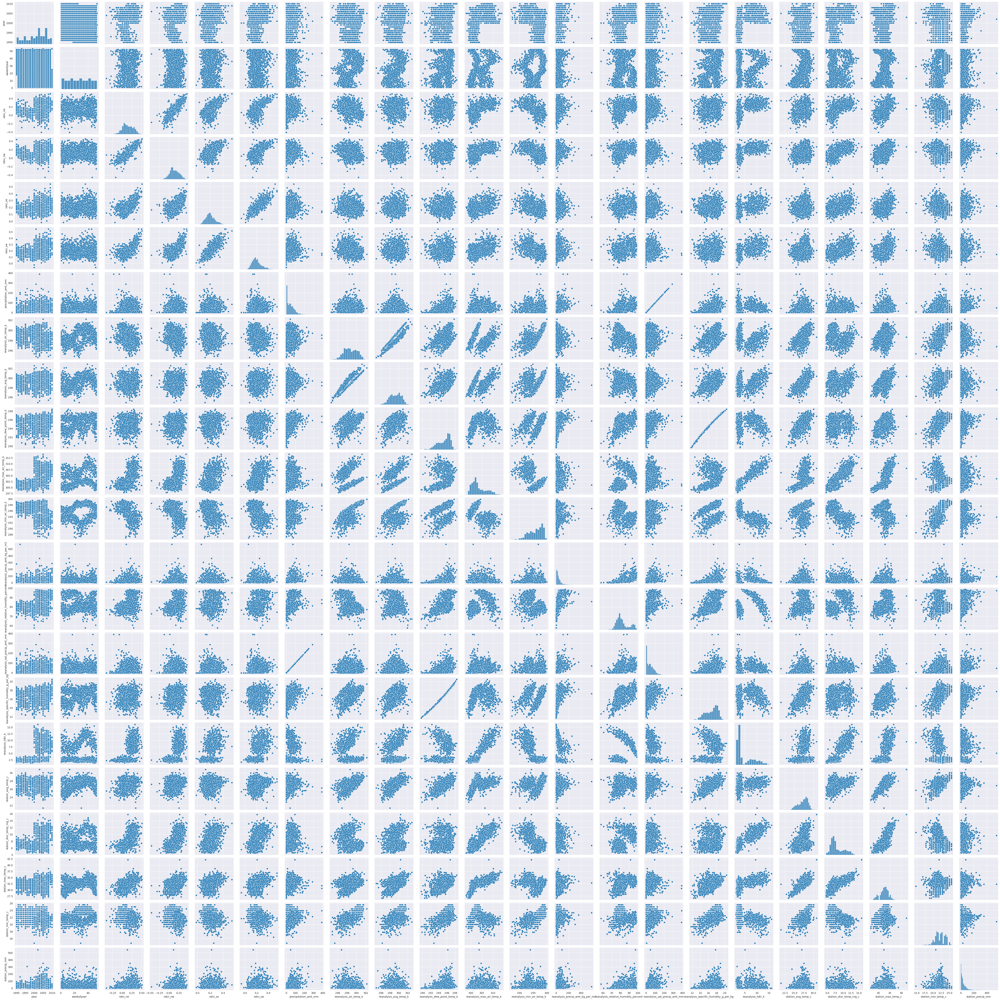

In [10]:
cols = df.columns[(df.columns != 'city') & (df.columns != 'week_start_date')]
sns.pairplot(df[cols]);

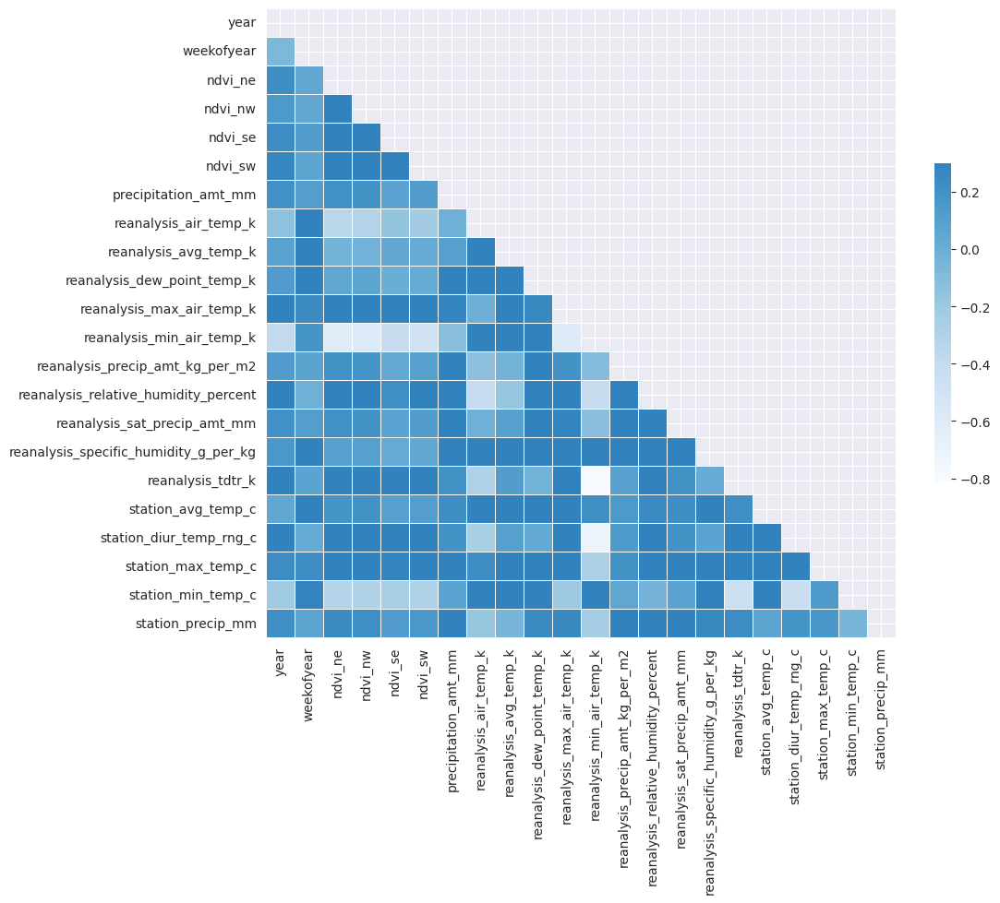

In [11]:


corr = df[cols].corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Generate a custom diverging colormap
cmap = sns.color_palette("Blues", as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

In [12]:
cols = df.columns[df.columns != 'ndvi_ne']
df[cols] = df[cols].interpolate()
df = df.drop('ndvi_ne', axis=1)
df.isnull().sum() * 100 / df.shape[0]

/tmp/ipykernel_5610/631559165.py:2: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df[cols] = df[cols].interpolate()


city                                     0.0
year                                     0.0
weekofyear                               0.0
week_start_date                          0.0
ndvi_nw                                  0.0
ndvi_se                                  0.0
ndvi_sw                                  0.0
precipitation_amt_mm                     0.0
reanalysis_air_temp_k                    0.0
reanalysis_avg_temp_k                    0.0
reanalysis_dew_point_temp_k              0.0
reanalysis_max_air_temp_k                0.0
reanalysis_min_air_temp_k                0.0
reanalysis_precip_amt_kg_per_m2          0.0
reanalysis_relative_humidity_percent     0.0
reanalysis_sat_precip_amt_mm             0.0
reanalysis_specific_humidity_g_per_kg    0.0
reanalysis_tdtr_k                        0.0
station_avg_temp_c                       0.0
station_diur_temp_rng_c                  0.0
station_max_temp_c                       0.0
station_min_temp_c                       0.0
station_pr

In [13]:
df = df.merge(total_cases, on=['city', 'year', 'weekofyear'], how="inner")
df

,city,year,weekofyear,week_start_date,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,iq,2010,21,2010-05-28,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,...,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0,5
1452,iq,2010,22,2010-06-04,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,...,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6,8
1453,iq,2010,23,2010-06-11,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,...,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4,1
1454,iq,2010,24,2010-06-18,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,...,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0,1


In [37]:
df_sj = df.query("city == 'sj'").copy()
df_sj.index = df_sj['week_start_date']
#df_sj = df_sj.drop(['week_start_date','city'], axis=1)
df_sj

,city,year,weekofyear,week_start_date,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,sj,1990,18,1990-04-30,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1990-05-07,sj,1990,19,1990-05-07,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
1990-05-14,sj,1990,20,1990-05-14,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
1990-05-21,sj,1990,21,1990-05-21,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
1990-05-28,sj,1990,22,1990-05-28,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-03-25,sj,2008,13,2008-03-25,-0.039900,0.310471,0.296243,27.19,296.958571,296.957143,...,74.247143,27.19,13.644286,2.885714,25.042857,5.785714,30.0,21.1,1.8,4
2008-04-01,sj,2008,14,2008-04-01,-0.016833,0.119371,0.066386,3.82,298.081429,298.228571,...,74.600000,3.82,14.662857,2.714286,26.242857,6.814286,30.6,22.2,0.5,3
2008-04-08,sj,2008,15,2008-04-08,-0.052750,0.137757,0.141214,16.96,297.460000,297.564286,...,75.027143,16.96,14.184286,2.185714,25.000000,5.714286,29.4,21.7,30.7,1


In [15]:
df_iq = df.query("city == 'iq'").copy()
df_iq.index = df_iq['week_start_date']
df_iq = df_iq.drop(['week_start_date', 'city'], axis=1)
df_iq

,year,weekofyear,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,
2000-07-01,2000,26,0.132257,0.340886,0.247200,25.41,296.740000,298.450000,295.184286,307.3,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
2000-07-08,2000,27,0.276100,0.289457,0.241657,60.61,296.634286,298.428571,295.358571,306.6,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
2000-07-15,2000,28,0.173129,0.204114,0.128014,55.52,296.415714,297.392857,295.622857,304.5,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
2000-07-22,2000,29,0.145429,0.254200,0.200314,5.60,295.357143,296.228571,292.797143,303.6,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
2000-07-29,2000,30,0.322129,0.254371,0.361043,62.76,296.432857,297.635714,293.957143,307.0,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-05-28,2010,21,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,296.825714,309.7,...,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0,5
2010-06-04,2010,22,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,296.452857,308.5,...,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6,8
2010-06-11,2010,23,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,295.501429,305.5,...,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4,1


### 🧩 Comparativa de Técnicas de Reducción de Dimensión: `X + Y` vs. Enfoque Híbrido

| Técnica                         | Tipo de reducción     | ¿Supervisada? | ¿Y usada explícitamente? | Dificultad para reconstruir Y | Notas clave |
|----------------------------------|-------------------------|----------------|----------------------------|-------------------------------|-------------|
| **PCA sobre `X + Y`**            | Reducción conjunta      | ❌ No          | ✅ Sí (pero no supervisada) | 🟡 Media                      | Captura varianza conjunta, pero sin optimizar relación con Y. Riesgo de leakage si se usan valores futuros. |
| **PLS sobre `X + Y`**            | Reducción conjunta      | ✅ Sí          | ✅ Sí                      | 🟢 Baja                       | Optimiza componentes para predecir Y. Buena opción si no hay leakage temporal. |
| **Autoencoder sobre `X + Y`**    | Reducción conjunta      | ⚠️ Depende     | ✅ Sí                      | 🟡 Media / 🟢 Baja            | Capta patrones complejos. Riesgo de leakage si no se cuida la estructura temporal. |
| **PCA + fusión con Y**           | Enfoque híbrido         | ⚠️ Parcial     | ✅ Sí (explícito)          | 🟢 Baja                       | PCA sobre X, luego combinas PC1 con Y (por ponderación, concatenación o regresión). |
| **PLS sobre `PC_X + Y`**         | Enfoque híbrido         | ✅ Sí          | ✅ Sí                      | 🟢 Baja                       | Dos etapas: primero reduces X, luego haces reducción supervisada con Y. |
| **Autoencoder sobre `PC_X + Y`** | Enfoque híbrido         | ⚠️ Parcial     | ✅ Sí                      | 🟡 Media / 🟢 Baja            | Similar al anterior, pero usando compresión no lineal tras PCA. Flexible, pero más complejo. |
| **Autoencoder predictivo**       | Enfoque híbrido         | ✅ Sí          | ✅ Sí                      | 🟢 Baja                       | Entrenas un autoencoder o seq2seq para comprimir X y predecir Y explícitamente. Muy efectivo, pero más costoso. |


In [16]:
tmp_df = df_sj.drop('total_cases', axis=1)

In [17]:
/  # Initialize the scaler
scaler = StandardScaler(copy=True)

# Fit and transform the data
standardized_data = scaler.fit_transform(tmp_df)
print("Standardized Data (Z-score Normalization):")
pd.DataFrame(standardized_data)


Standardized Data (Z-score Normalization):


,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-1.694458,-0.566356,0.410562,0.376015,0.206800,-0.516022,-1.282258,-1.254202,-1.716084,-1.264413,...,0.044400,-1.540027,-0.516022,-1.626033,0.229673,-1.099174,0.174930,-1.277831,-1.723902,-0.368813
1,-1.694458,-0.499751,0.831965,-0.258944,-0.190198,-0.282338,-0.765473,-0.679506,-0.735181,-0.390490,...,-0.351613,-0.355272,-0.282338,-0.753132,-0.286815,-0.200494,-0.457910,0.060390,-0.261731,-0.622014
2,-1.694458,-0.433146,1.169434,-0.349585,0.085288,-0.018994,-0.304182,-0.321788,0.211081,-0.708280,...,-0.121779,1.031170,-0.018994,0.194038,-0.430284,-0.200494,-0.321080,0.351308,0.137043,0.500283
3,-1.694458,-0.366541,1.959633,0.887019,1.252061,-0.449962,-0.137701,-0.034440,0.131770,0.006748,...,-0.465404,0.523358,-0.449962,0.081258,-0.172040,0.334675,0.020996,0.991327,0.469355,-0.779409
4,-1.694458,-0.299936,2.147410,1.302569,1.457534,-0.626124,0.292375,0.323279,0.458130,0.403986,...,-0.513286,0.559721,-0.626124,0.426017,1.004404,1.374720,3.133884,1.980448,0.868129,-0.717820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931,1.760907,-0.899381,-1.163534,2.344330,2.334781,-0.184146,-1.779389,-1.899268,-1.919375,-1.343860,...,-0.644258,-1.279144,-0.184146,-1.862596,0.746160,-1.381905,-1.159165,-0.928730,-0.992817,-0.854685
932,1.760907,-0.832776,-0.910729,-1.014465,-1.788521,-0.709261,-0.870680,-0.855433,-1.191902,-1.264413,...,-0.753542,-1.174707,-0.709261,-1.208837,0.401835,-0.533713,0.072307,-0.579629,-0.261731,-0.899166
933,1.760907,-0.766171,-1.304367,-0.691316,-0.446206,-0.414010,-1.373591,-1.400808,-1.512792,-1.582203,...,0.128898,-1.048282,-0.414010,-1.516003,-0.659834,-1.412197,-1.244684,-1.277831,-0.594043,0.134168
934,1.760907,-0.699566,-1.072111,0.471219,0.784891,-0.795095,-1.236013,-1.224880,-1.805422,-1.343860,...,-0.721151,-1.859683,-0.795095,-1.725059,0.545304,-1.190052,-0.611844,-1.277831,-0.594043,-0.533051


In [18]:
standardized_data[:, -1]

array([-3.68812865e-01, -6.22013918e-01,  5.00282642e-01, -7.79409167e-01,
       -7.17819722e-01,  4.21585018e-01,  9.99512474e-02, -1.94309436e-01,
       -1.94309436e-01, -8.78636607e-01,  1.26330744e+00, -4.98835027e-01,
        1.99178687e-01,  3.70260480e-01, -5.26208114e-01,  6.13196625e-01,
       -7.31506265e-01, -4.47510489e-01, -4.30402310e-01, -3.00709151e-02,
       -8.03360618e-01, -3.75656136e-01, -5.15943206e-01,  1.05800929e+00,
        1.19829636e+00,  2.21452221e+00, -7.00711542e-01, -6.90446635e-01,
        4.14741746e-01, -5.87797559e-01, -2.69782827e-03,  1.44465414e+00,
       -8.20468797e-01, -2.38790702e-01, -2.01152708e-01, -7.34927901e-01,
        1.68383964e-01, -3.51704685e-01, -6.83603363e-01, -7.14398086e-01,
       -6.66495184e-01, -7.24662993e-01, -3.07223419e-01,  1.34167606e-01,
       -5.43316293e-01, -7.93095711e-01, -7.21241358e-01,  4.14544344e-03,
       -7.75987531e-01, -2.73007061e-01, -2.52477246e-01, -7.96517346e-01,
       -8.20468797e-01,  

In [19]:
standardized_data.mean()

4.451375278871527e-15

In [20]:

pca = PCA(n_components=21)
pca.fit(standardized_data)

PCA(n_components=21)

In [21]:
pca.explained_variance_

array([8.78584386e+00, 3.33478488e+00, 2.06197038e+00, 1.67471535e+00,
       1.47685321e+00, 6.87186681e-01, 6.49603324e-01, 5.70216802e-01,
       5.17772049e-01, 3.63588342e-01, 2.84215126e-01, 2.03935532e-01,
       1.71986772e-01, 1.15563063e-01, 5.40449727e-02, 3.95906326e-02,
       2.62306954e-02, 3.05355641e-03, 1.22421469e-03, 8.04591692e-05,
       1.30537942e-16])

In [22]:
pca.explained_variance_ratio_

array([4.17926537e-01, 1.58629623e-01, 9.80841629e-02, 7.96631486e-02,
       7.02512082e-02, 3.26882146e-02, 3.09004430e-02, 2.71241712e-02,
       2.46294702e-02, 1.72952330e-02, 1.35195941e-02, 9.70084057e-03,
       8.18109647e-03, 5.49712372e-03, 2.57082059e-03, 1.88325404e-03,
       1.24774625e-03, 1.45252098e-04, 5.82336556e-05, 3.82729565e-06,
       6.20945133e-18])

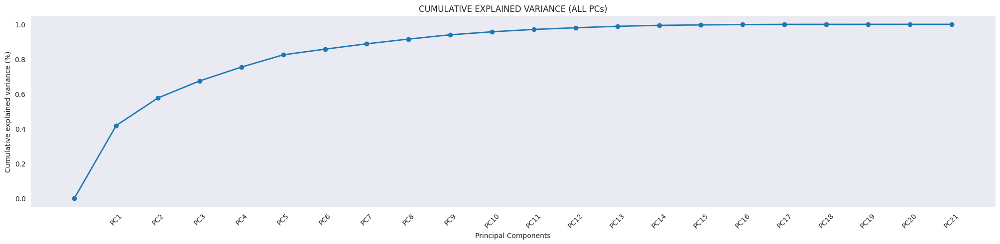

In [23]:
# MAKE THE CUMULATIVE EXPLAINED VARIANCE PLOT
plt.figure(figsize=(25, 5))
plt.plot(np.insert(np.cumsum(pca.explained_variance_ratio_), 0, 0), 'o-', linewidth=2)
plt.title('CUMULATIVE EXPLAINED VARIANCE (ALL PCs)')
plt.xticks(ticks=np.arange(1, pca.n_features_in_ + 1),
           labels=[f'PC{i}' for i in range(1, pca.n_features_in_ + 1)],
           rotation=45)
plt.xlabel('Principal Components')
plt.ylabel('Cumulative explained variance (%)')
plt.grid()
plt.show()


Explained variance for 1 components (Before): 0.41792653686755077
Explained variance for 2 components (Before): 0.5765561595303208
Explained variance for 3 components (Before): 0.6746403223807154
Explained variance for 4 components (Before): 0.7543034709914769
Explained variance for 5 components (Before): 0.8245546791779503
Explained variance for 6 components (Before): 0.8572428938009622
Explained variance for 7 components (Before): 0.8881433368083159
Explained variance for 8 components (Before): 0.9152675080415885
Explained variance for 9 components (Before): 0.9398969782026941
Explained variance for 10 components (Before): 0.9571922111762435


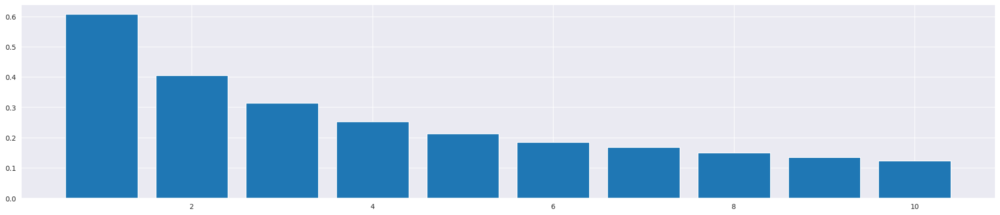

In [24]:
def explained_variance_experiment(X, y, n_components=10):
    variance_explained = []
    scaler = StandardScaler(copy=True)
    X = scaler.fit_transform(X)

    for i in range(1, n_components + 1):
        pca_1 = PCA(n_components=i)
        pca_2 = PCA(n_components=1)
        components = pca_1.fit_transform(X)
        new_X = np.column_stack((components, df_sj['total_cases'].values))
        new_X = scaler.fit_transform(new_X)
        pca_2.fit_transform(new_X)
        print(f"Explained variance for {i} components (Before): {pca_1.explained_variance_ratio_.sum()}")
        variance_explained.append(pca_2.explained_variance_ratio_.sum())

    plt.figure(figsize=(25, 5))
    plt.bar(range(1, n_components + 1), variance_explained)

    plt.show()


explained_variance_experiment(tmp_df, df_sj['total_cases'].values)

In [25]:
pca_1 = PCA(n_components=1)
pca_2 = PCA(n_components=1)
components = pca_1.fit_transform(tmp_df)
comps_X = np.column_stack((components, df_sj['total_cases'].values))
new_X = pca_2.fit_transform(comps_X)
new_X = scaler.fit_transform(new_X)
new_X

array([[-5.20828884e-01],
       [-4.24607654e-01],
       [-3.67270448e-02],
       [-5.98503166e-01],
       [-7.34905239e-01],
       [-4.99102547e-01],
       [-5.84922298e-01],
       [ 2.02451333e+00],
       [-3.24037836e-01],
       [-5.45757555e-01],
       [-6.91882010e-02],
       [ 3.67371430e-01],
       [-3.09533902e-01],
       [-1.17583642e-02],
       [-2.47650890e-01],
       [ 1.39313883e+00],
       [-1.79783372e-01],
       [ 9.13153003e-02],
       [-1.80800611e-01],
       [ 4.81386669e-01],
       [ 1.92479854e+00],
       [ 1.75718389e-01],
       [-8.36561097e-02],
       [ 9.22792618e-01],
       [ 3.34286984e+00],
       [ 2.26101606e+00],
       [ 1.13499812e+00],
       [-3.44729490e-01],
       [-3.08331801e-01],
       [-2.60995570e-01],
       [ 8.81137756e-02],
       [-3.74704341e-02],
       [-8.29746595e-01],
       [ 2.96193037e-01],
       [-7.84136392e-01],
       [-9.05043120e-01],
       [-4.02199876e-01],
       [-7.36166746e-01],
       [-8.9

In [26]:
aux = pd.DataFrame(zip(df_sj.index, new_X), columns=['date', 'target'])
aux.target = aux.target.astype(float)
aux.date = pd.to_datetime(aux.date)
aux['id_time_series'] = '0'
aux

,date,target,id_time_series
0,1990-04-30,-0.520829,0
1,1990-05-07,-0.424608,0
2,1990-05-14,-0.036727,0
3,1990-05-21,-0.598503,0
4,1990-05-28,-0.734905,0
...,...,...,...
931,2008-03-25,-0.432243,0
932,2008-04-01,-0.880996,0
933,2008-04-08,-0.370803,0
934,2008-04-15,-0.900820,0


In [27]:
train_data = TimeSeriesDataFrame.from_data_frame(
    aux,
    id_column="id_time_series",
    timestamp_column="date"
)
train_data = train_data.convert_frequency(freq="W")
train_data

target
item_id timestamp           
0       1990-05-06 -0.520829
        1990-05-13 -0.424608
        1990-05-20 -0.036727
        1990-05-27 -0.598503
        1990-06-03 -0.734905
...                      ...
        2008-03-30 -0.432243
        2008-04-06 -0.880996
        2008-04-13 -0.370803
        2008-04-20 -0.900820
        2008-04-27 -0.950691

[939 rows x 1 columns]

In [28]:
use_cuda = torch.cuda.is_available()
print(
    f"We will use {'chronos_small' if use_cuda else 'bolt_small'} because cuda is {'not ' if not use_cuda else ''}available")

We will use chronos_small because cuda is available


In [29]:


predictor = TimeSeriesPredictor(prediction_length=10).fit(
    train_data, presets="chronos_base" if use_cuda else "bolt_small",
)



Beginning AutoGluon training...
AutoGluon will save models to '/home/antares/Documents/PoliTo/Fall_24/DeepNLP/DeepNLP_Forecasting/AutogluonModels/ag-20250517_130831'
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.12.9
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #202412060638~1743109366~22.04~1fce33b SMP PREEMPT_DYNAMIC Thu M
CPU Count:          16
GPU Count:          1
Memory Avail:       5.57 GB / 15.32 GB (36.3%)
Disk Space Avail:   320.79 GB / 441.91 GB (72.6%)
Setting presets to: chronos_base

Fitting with arguments:
{'enable_ensemble': True,
 'eval_metric': WQL,
 'hyperparameters': {'Chronos': {'model_path': 'base'}},
 'known_covariates_names': [],
 'num_val_windows': 1,
 'prediction_length': 10,
 'quantile_levels': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
 'random_seed': 123,
 'refit_every_n_windows': 1,
 'refit_full': False,
 'skip_model_selection': True,
 'target': 'target',
 'verbosity': 2}



Model not specified in predict, will default to the model with the best validation score: Chronos[base]


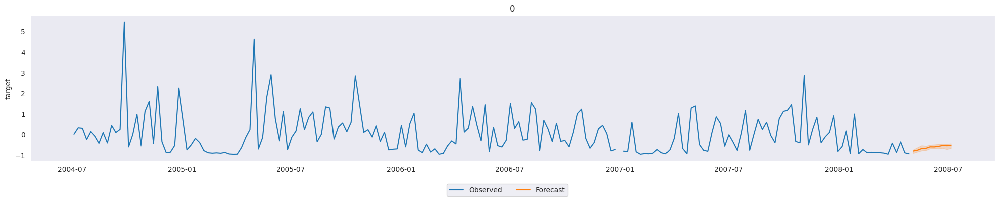

In [30]:
predictions = predictor.predict(train_data)
predictor.plot(
    data=train_data,
    predictions=predictions,
    item_ids=train_data.item_ids[0],
    max_history_length=200,
);

In [31]:
temp_df = pd.DataFrame(new_X, columns=['target'], index=df_sj.index)
temp_df.index = pd.to_datetime(temp_df.index)

In [32]:
temp_df

,target
week_start_date,
1990-04-30,-0.520829
1990-05-07,-0.424608
1990-05-14,-0.036727
1990-05-21,-0.598503
1990-05-28,-0.734905
...,...
2008-03-25,-0.432243
2008-04-01,-0.880996
2008-04-08,-0.370803


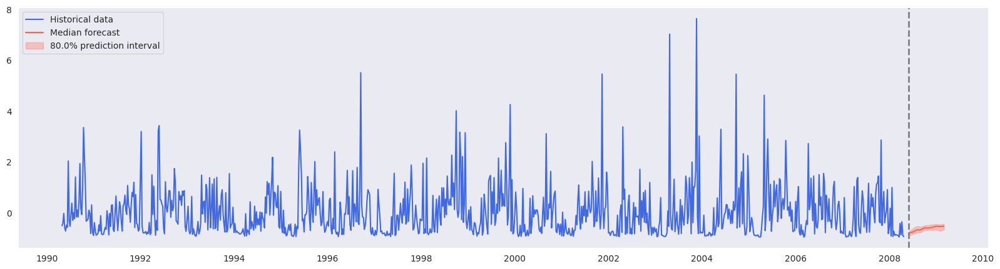

In [33]:
low, median, high = predictions.loc[:, "0.1"], predictions.loc[:, "0.5"], predictions.loc[:, "0.9"]
plot_timeseries_forecasting(temp_df, low, median, high, prediction_length=10)

In [34]:
prediction_length = 10
predictions2 = predictor.predict(train_data.iloc[: -prediction_length])

Model not specified in predict, will default to the model with the best validation score: Chronos[base]


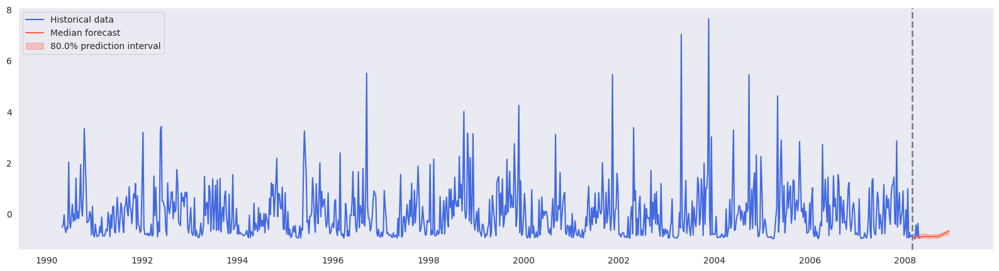

In [35]:
low, median, high = predictions2.loc[:, "0.1"], predictions2.loc[:, "0.5"], predictions2.loc[:, "0.9"]
start_forecasting_date = train_data.index.get_level_values("timestamp")[-prediction_length]
plot_timeseries_forecasting(temp_df, low, median, high,
                            start_forecasting_date=start_forecasting_date,
                            prediction_length=prediction_length)

In [36]:
df_sj

,year,weekofyear,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,1990,18,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,292.414286,299.8,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1990-05-07,1990,19,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,293.951429,300.9,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
1990-05-14,1990,20,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,295.434286,300.5,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
1990-05-21,1990,21,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,295.310000,301.4,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
1990-05-28,1990,22,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,295.821429,301.9,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008-03-25,2008,13,-0.039900,0.310471,0.296243,27.19,296.958571,296.957143,292.095714,299.7,...,74.247143,27.19,13.644286,2.885714,25.042857,5.785714,30.0,21.1,1.8,4
2008-04-01,2008,14,-0.016833,0.119371,0.066386,3.82,298.081429,298.228571,293.235714,299.8,...,74.600000,3.82,14.662857,2.714286,26.242857,6.814286,30.6,22.2,0.5,3
2008-04-08,2008,15,-0.052750,0.137757,0.141214,16.96,297.460000,297.564286,292.732857,299.4,...,75.027143,16.96,14.184286,2.185714,25.000000,5.714286,29.4,21.7,30.7,1


In [40]:
sj_timeseries = TimeSeriesDataFrame.from_data_frame(df_sj, id_column="city", timestamp_column="week_start_date")
sj_timeseries = sj_timeseries.convert_frequency(freq="W")
sj_timeseries

year  weekofyear   ndvi_nw   ndvi_se   ndvi_sw  \
item_id timestamp                                                      
sj      1990-05-06  1990.0        18.0  0.103725  0.198483  0.177617   
        1990-05-13  1990.0        19.0  0.142175  0.162357  0.155486   
        1990-05-20  1990.0        20.0  0.172967  0.157200  0.170843   
        1990-05-27  1990.0        21.0  0.245067  0.227557  0.235886   
        1990-06-03  1990.0        22.0  0.262200  0.251200  0.247340   
...                    ...         ...       ...       ...       ...   
        2008-03-30  2008.0        13.0 -0.039900  0.310471  0.296243   
        2008-04-06  2008.0        14.0 -0.016833  0.119371  0.066386   
        2008-04-13  2008.0        15.0 -0.052750  0.137757  0.141214   
        2008-04-20  2008.0        16.0 -0.031558  0.203900  0.209843   
        2008-04-27  2008.0        17.0 -0.010367  0.077314  0.090586   

                    precipitation_amt_mm  reanalysis_air_temp_k  \
item_id timestamp                                                 
sj      1990-05-06                 12.42             297.572857   
        1990-05-13                 22.82             298.211429   
        1990-05-20                 34.54             298.781429   
        1990-05-27                 15.36             298.987143   
        1990-06-03                  7.52             299.518571   
...                                  ...                    ...   
        2008-03-30                 27.19             296.958571   
        2008-04-06                  3.82             298.081429   
        2008-04-13                 16.96             297.460000   
        2008-04-20                  0.00             297.630000   
        2008-04-27                  0.00             298.672857   

                    reanalysis_avg_temp_k  reanalysis_dew_point_temp_k  \
item_id timestamp                                                        
sj      1990-05-06             297.742857                   292.414286   
        1990-05-13             298.442857                   293.951429   
        1990-05-20             298.878571                   295.434286   
        1990-05-27             299.228571                   295.310000   
        1990-06-03             299.664286                   295.821429   
...                                   ...                          ...   
        2008-03-30             296.957143                   292.095714   
        2008-04-06             298.228571                   293.235714   
        2008-04-13             297.564286                   292.732857   
        2008-04-20             297.778571                   292.274286   
        2008-04-27             298.692857                   294.280000   

                    reanalysis_max_air_temp_k  ...  \
item_id timestamp                              ...   
sj      1990-05-06                      299.8  ...   
        1990-05-13                      300.9  ...   
        1990-05-20                      300.5  ...   
        1990-05-27                      301.4  ...   
        1990-06-03                      301.9  ...   
...                                       ...  ...   
        2008-03-30                      299.7  ...   
        2008-04-06                      299.8  ...   
        2008-04-13                      299.4  ...   
        2008-04-20                      299.7  ...   
        2008-04-27                      300.9  ...   

                    reanalysis_relative_humidity_percent  \
item_id timestamp                                          
sj      1990-05-06                             73.365714   
        1990-05-13                             77.368571   
        1990-05-20                             82.052857   
        1990-05-27                             80.337143   
        1990-06-03                             80.460000   
...                                                  ...   
        2008-03-30                             74.247143   
       

In [77]:
prediction_length = 8
train_data, test_data = sj_timeseries.train_test_split(prediction_length=prediction_length)

In [73]:
train_data

year  weekofyear   ndvi_nw   ndvi_se   ndvi_sw  \
item_id timestamp                                                      
sj      1990-05-06  1990.0        18.0  0.103725  0.198483  0.177617   
        1990-05-13  1990.0        19.0  0.142175  0.162357  0.155486   
        1990-05-20  1990.0        20.0  0.172967  0.157200  0.170843   
        1990-05-27  1990.0        21.0  0.245067  0.227557  0.235886   
        1990-06-03  1990.0        22.0  0.262200  0.251200  0.247340   
...                    ...         ...       ...       ...       ...   
        2008-02-03  2008.0         5.0 -0.135400  0.223300  0.170943   
        2008-02-10  2008.0         6.0 -0.003200  0.232843  0.271171   
        2008-02-17  2008.0         7.0 -0.063100  0.150200  0.149271   
        2008-02-24  2008.0         8.0 -0.095067  0.246057  0.228129   
        2008-03-02  2008.0         9.0  0.015420  0.211629  0.117343   

                    precipitation_amt_mm  reanalysis_air_temp_k  \
item_id timestamp                                                 
sj      1990-05-06                 12.42             297.572857   
        1990-05-13                 22.82             298.211429   
        1990-05-20                 34.54             298.781429   
        1990-05-27                 15.36             298.987143   
        1990-06-03                  7.52             299.518571   
...                                  ...                    ...   
        2008-02-03                  0.00             298.021429   
        2008-02-10                  0.00             297.237143   
        2008-02-17                  0.00             297.838571   
        2008-02-24                  0.00             297.907143   
        2008-03-02                  0.00             297.765714   

                    reanalysis_avg_temp_k  reanalysis_dew_point_temp_k  \
item_id timestamp                                                        
sj      1990-05-06             297.742857                   292.414286   
        1990-05-13             298.442857                   293.951429   
        1990-05-20             298.878571                   295.434286   
        1990-05-27             299.228571                   295.310000   
        1990-06-03             299.664286                   295.821429   
...                                   ...                          ...   
        2008-02-03             298.178571                   292.957143   
        2008-02-10             297.278571                   291.537143   
        2008-02-17             297.907143                   292.941429   
        2008-02-24             298.057143                   293.134286   
        2008-03-02             298.071429                   292.502857   

                    reanalysis_max_air_temp_k  ...  \
item_id timestamp                              ...   
sj      1990-05-06                      299.8  ...   
        1990-05-13                      300.9  ...   
        1990-05-20                      300.5  ...   
        1990-05-27                      301.4  ...   
        1990-06-03                      301.9  ...   
...                                       ...  ...   
        2008-02-03                      300.7  ...   
        2008-02-10                      299.3  ...   
        2008-02-17                      299.3  ...   
        2008-02-24                      299.6  ...   
        2008-03-02                      299.9  ...   

                    reanalysis_relative_humidity_percent  \
item_id timestamp                                          
sj      1990-05-06                             73.365714   
        1990-05-13                             77.368571   
        1990-05-20                             82.052857   
        1990-05-27                             80.337143   
        1990-06-03                             80.460000   
...                                                  ...   
        2008-02-03                             73.565714   
       

In [78]:
covar_labels= ['year', 'weekofyear', 'ndvi_nw', 'ndvi_se', 'ndvi_sw',
                            'precipitation_amt_mm', 'reanalysis_air_temp_k',
                            'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                            'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
                            'reanalysis_precip_amt_kg_per_m2',
                            'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                            'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
                            'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
                            'station_min_temp_c', 'station_precip_mm']

In [81]:
covariates  = test_data.drop('total_cases', axis=1, inplace=False)
covariates[covar_labels].iloc[-prediction_length:]

year  weekofyear   ndvi_nw   ndvi_se   ndvi_sw  \
item_id timestamp                                                      
sj      2008-03-09  2008.0        10.0 -0.090033  0.223243  0.154186   
        2008-03-16  2008.0        11.0 -0.141200  0.110643  0.141014   
        2008-03-23  2008.0        12.0  0.024450  0.101629  0.088000   
        2008-03-30  2008.0        13.0 -0.039900  0.310471  0.296243   
        2008-04-06  2008.0        14.0 -0.016833  0.119371  0.066386   
        2008-04-13  2008.0        15.0 -0.052750  0.137757  0.141214   
        2008-04-20  2008.0        16.0 -0.031558  0.203900  0.209843   
        2008-04-27  2008.0        17.0 -0.010367  0.077314  0.090586   

                    precipitation_amt_mm  reanalysis_air_temp_k  \
item_id timestamp                                                 
sj      2008-03-09                  0.00             297.878571   
        2008-03-16                  0.00             297.595714   
        2008-03-23                  0.00             297.404286   
        2008-03-30                 27.19             296.958571   
        2008-04-06                  3.82             298.081429   
        2008-04-13                 16.96             297.460000   
        2008-04-20                  0.00             297.630000   
        2008-04-27                  0.00             298.672857   

                    reanalysis_avg_temp_k  reanalysis_dew_point_temp_k  \
item_id timestamp                                                        
sj      2008-03-09             298.007143                   293.052857   
        2008-03-16             297.642857                   292.197143   
        2008-03-23             297.435714                   292.205714   
        2008-03-30             296.957143                   292.095714   
        2008-04-06             298.228571                   293.235714   
        2008-04-13             297.564286                   292.732857   
        2008-04-20             297.778571                   292.274286   
        2008-04-27             298.692857                   294.280000   

                    reanalysis_max_air_temp_k  ...  \
item_id timestamp                              ...   
sj      2008-03-09                      299.9  ...   
        2008-03-16                      299.5  ...   
        2008-03-23                      299.8  ...   
        2008-03-30                      299.7  ...   
        2008-04-06                      299.8  ...   
        2008-04-13                      299.4  ...   
        2008-04-20                      299.7  ...   
        2008-04-27                      300.9  ...   

                    reanalysis_precip_amt_kg_per_m2  \
item_id timestamp                                     
sj      2008-03-09                             6.50   
        2008-03-16                             9.38   
        2008-03-23                             0.90   
        2008-03-30                             7.55   
        2008-04-06                             3.67   
        2008-04-13                            35.00   
        2008-04-20                             4.82   
        2008-04-27                             2.17   

                    reanalysis_relative_humidity_percent  \
item_id timestamp                                          
sj      2008-03-09                             74.681429   
        2008-03-16                             71.934286   
        2008-03-23                             72.915714   
        2008-03-30                             74.247143   
        2008-04-06                             74.600000   
        2008-04-13                             75.027143   
        2008-04-20                             72.285714   
        2008-04-27                             76.960000   

                    reanalysis_sat_precip_amt_mm  \
item_id timestamp                                  
sj      2008-03-09                          0.00   
        2008-03-16                      

In [82]:
test_data

year  weekofyear   ndvi_nw   ndvi_se   ndvi_sw  \
item_id timestamp                                                      
sj      1990-05-06  1990.0        18.0  0.103725  0.198483  0.177617   
        1990-05-13  1990.0        19.0  0.142175  0.162357  0.155486   
        1990-05-20  1990.0        20.0  0.172967  0.157200  0.170843   
        1990-05-27  1990.0        21.0  0.245067  0.227557  0.235886   
        1990-06-03  1990.0        22.0  0.262200  0.251200  0.247340   
...                    ...         ...       ...       ...       ...   
        2008-03-30  2008.0        13.0 -0.039900  0.310471  0.296243   
        2008-04-06  2008.0        14.0 -0.016833  0.119371  0.066386   
        2008-04-13  2008.0        15.0 -0.052750  0.137757  0.141214   
        2008-04-20  2008.0        16.0 -0.031558  0.203900  0.209843   
        2008-04-27  2008.0        17.0 -0.010367  0.077314  0.090586   

                    precipitation_amt_mm  reanalysis_air_temp_k  \
item_id timestamp                                                 
sj      1990-05-06                 12.42             297.572857   
        1990-05-13                 22.82             298.211429   
        1990-05-20                 34.54             298.781429   
        1990-05-27                 15.36             298.987143   
        1990-06-03                  7.52             299.518571   
...                                  ...                    ...   
        2008-03-30                 27.19             296.958571   
        2008-04-06                  3.82             298.081429   
        2008-04-13                 16.96             297.460000   
        2008-04-20                  0.00             297.630000   
        2008-04-27                  0.00             298.672857   

                    reanalysis_avg_temp_k  reanalysis_dew_point_temp_k  \
item_id timestamp                                                        
sj      1990-05-06             297.742857                   292.414286   
        1990-05-13             298.442857                   293.951429   
        1990-05-20             298.878571                   295.434286   
        1990-05-27             299.228571                   295.310000   
        1990-06-03             299.664286                   295.821429   
...                                   ...                          ...   
        2008-03-30             296.957143                   292.095714   
        2008-04-06             298.228571                   293.235714   
        2008-04-13             297.564286                   292.732857   
        2008-04-20             297.778571                   292.274286   
        2008-04-27             298.692857                   294.280000   

                    reanalysis_max_air_temp_k  ...  \
item_id timestamp                              ...   
sj      1990-05-06                      299.8  ...   
        1990-05-13                      300.9  ...   
        1990-05-20                      300.5  ...   
        1990-05-27                      301.4  ...   
        1990-06-03                      301.9  ...   
...                                       ...  ...   
        2008-03-30                      299.7  ...   
        2008-04-06                      299.8  ...   
        2008-04-13                      299.4  ...   
        2008-04-20                      299.7  ...   
        2008-04-27                      300.9  ...   

                    reanalysis_relative_humidity_percent  \
item_id timestamp                                          
sj      1990-05-06                             73.365714   
        1990-05-13                             77.368571   
        1990-05-20                             82.052857   
        1990-05-27                             80.337143   
        1990-06-03                             80.460000   
...                                                  ...   
        2008-03-30                             74.247143   
       

In [47]:
sj_timeseries.columns

Index(['year', 'weekofyear', 'ndvi_nw', 'ndvi_se', 'ndvi_sw',
       'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases'],
      dtype='object')

In [83]:
predictor = TimeSeriesPredictor(
    prediction_length=prediction_length,
    target="total_cases",
    known_covariates_names=['year', 'weekofyear', 'ndvi_nw', 'ndvi_se', 'ndvi_sw',
                            'precipitation_amt_mm', 'reanalysis_air_temp_k',
                            'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                            'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
                            'reanalysis_precip_amt_kg_per_m2',
                            'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
                            'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
                            'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
                            'station_min_temp_c', 'station_precip_mm'],
).fit(
    train_data,
    hyperparameters={
        "Chronos": [
            # Zero-shot model WITHOUT covariates
            {
                "model_path": "bolt_small",
                "ag_args": {"name_suffix": "ZeroShot"},
            },
            # Chronos-Bolt (Small) combined with CatBoost on covariates
            {
                "model_path": "bolt_small",
                "covariate_regressor": "CAT",
                "target_scaler": "standard",
                "ag_args": {"name_suffix": "WithRegressor"},
            },
        ],
    },
    enable_ensemble=False,
    time_limit=60,
)

Beginning AutoGluon training... Time limit = 60s
AutoGluon will save models to '/home/antares/Documents/PoliTo/Fall_24/DeepNLP/DeepNLP_Forecasting/AutogluonModels/ag-20250517_143516'
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.12.9
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #202412060638~1743109366~22.04~1fce33b SMP PREEMPT_DYNAMIC Thu M
CPU Count:          16
GPU Count:          1
Memory Avail:       4.28 GB / 15.32 GB (27.9%)
Disk Space Avail:   320.53 GB / 441.91 GB (72.5%)

Fitting with arguments:
{'enable_ensemble': False,
 'eval_metric': WQL,
 'hyperparameters': {'Chronos': [{'ag_args': {'name_suffix': 'ZeroShot'},
                                  'model_path': 'bolt_small'},
                                 {'ag_args': {'name_suffix': 'WithRegressor'},
                                  'covariate_regressor': 'CAT',
                                  'model_path': 'bolt_small',
                   

In [84]:
predictor.leaderboard(test_data)

Additional data provided, testing on additional data. Resulting leaderboard will be sorted according to test score (`score_test`).


,model,score_test,score_val,pred_time_test,pred_time_val,fit_time_marginal,fit_order
0,ChronosZeroShot[bolt_small],-0.532588,-0.281756,1.042695,1.115432,0.008487,1
1,ChronosWithRegressor[bolt_small],-0.820302,-0.292716,1.023738,0.860149,0.625757,2


In [85]:
predictions3 = predictor.predict(
    test_data.iloc[: -prediction_length], known_covariates=covariates[covar_labels].iloc[-prediction_length:])

Model not specified in predict, will default to the model with the best validation score: ChronosZeroShot[bolt_small]


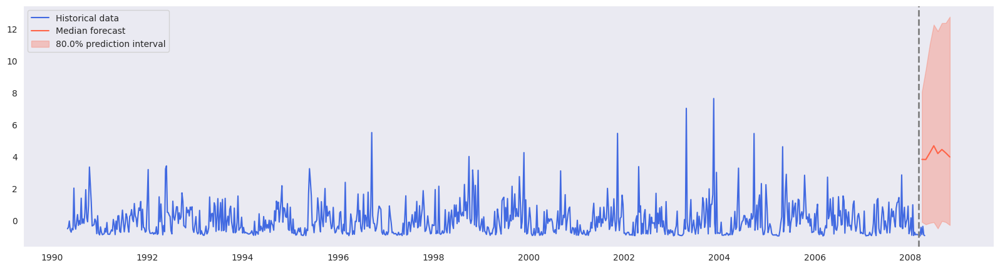

In [86]:
low, median, high = predictions3.loc[:, "0.1"], predictions3.loc[:, "0.5"], predictions3.loc[:, "0.9"]
start_forecasting_date = test_data.index.get_level_values("timestamp")[-prediction_length]
plot_timeseries_forecasting(temp_df, low, median, high,
                            start_forecasting_date=start_forecasting_date,
                            prediction_length=prediction_length)